Cell Ranger v7.0.0 chemistry: SC 3P v3, force_cells: N/A, include_introns: true, no_bam: true, no_secondary_analysis: true GRCh38-2020-A 2020-A Single Cell 3’ Gene Expression

Control: 14, 409, 4092(409 #2), 1516, 15162(1516 #2), 729, 1432, 1532, T136, T1952, T551, T99

SCA1: 11, 12, 122 (12 #2), 13, 132(13 #2), CB, CT, RT, CNGA-0047, CNGA-0061, CNGA-0064, UMB1354



In [1]:
# Import packages
import os, sys, glob, re, math, pickle
import phate, scprep, magic, meld
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import time,random,datetime
import networkx as nx
import scvelo as scv
from sklearn import metrics
from sklearn import model_selection
from scipy import sparse
from scipy.stats import mannwhitneyu, tiecorrect, rankdata
from statsmodels.stats.multitest import multipletests
import scanpy as sc
from sklearn.dummy import DummyClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import SpectralClustering, OPTICS, cluster_optics_dbscan, AgglomerativeClustering
from bbknn import bbknn
%matplotlib inline
%load_ext memory_profiler
import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=True
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1

# reproducibility
rs = np.random.seed(42)

In [2]:
# fps
dfp = '/home/cl2292/project/SCA1_snRNAseq/Human/data/'
pfp = '/home/cl2292/project/SCA1_snRNAseq/Human/results_20230402/'
pdfp = '/home/cl2292/project/SCA1_snRNAseq/Human/data/processed/'
sc.settings.figdir = pfp

In [3]:
# Load Data

if True :
    start = time.time()
    backed=None # None if not
    fname='230419_bbknn_noscrublet.h5ad' # for full, can maybe get away with ~300G
    %memit adata = sc.read_h5ad(os.path.join(pdfp,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))

peak memory: 11642.50 MiB, increment: 11339.80 MiB
loaded @230502.13:06:15
took 10.38-s to load data


In [4]:
sc.tl.louvain(adata, resolution=25)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:03:22)


In [ ]:
sc.pl.umap(adata, color ='louvain')

In [6]:
markers = {
    'Granule cell':['GABRA6','SLC17A7'],
    'Unipolar brush cell':['SLC17A6','EOMES'],
    'Purkinje cell':['ATP2A3','CALB1','CA8','PPP1R17','SLC1A6'],
    'Inhibitory interneuron':['GAD1','GAD2','NTN1','MEGF10', 'LYPD6', 'SORCS3', 'PTPRK', 'NXPH1', 'CDH22', 'LGI2'],
    'Astrocyte':['ALDH1L1','AQP4'],
    'Bergmann glia':['GDF10','HOPX'],
    'OPC':['PDGFRA', 'CSPG4'],
    'OL':['PLP1','HAPLN2','MAG','MOG','OPALIN'],
    'Microglia':['C1QB','CX3CR1','DOCK2','P2RY12'],
    'Pericytes':['PDGFRB','FLT1','RGS5','NOTCH3','S1PR3','ABCC9','GRM8'],
    'Endothelial cell':['CLDN5','DCN','LUM','KDR','PECAM1','A2M','SLC2A1']
}

In [ ]:
sc.pl.dotplot(adata, markers, groupby='louvain', standard_scale='var')

In [8]:
# annotate cell type
PC = ['166','213']


ctype = []
for i in adata.obs['louvain'] : # verbose loop for quality-assurance
    if i in PC :
        ctype.append('PC')
    else :
        ctype.append('NA')
        #raise ValueError('Encountered unclassifiable genotype for sample {}'.format(i))
adata.obs['ctype2']=ctype


print(adata)

AnnData object with n_obs × n_vars = 238149 × 34430
    obs: 'doublet_score', 'predicted_doublet', 'batch', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pmito', 'n_genes', 'n_counts', 'louvain', 'ctype2'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'batch_colors', 'genotype_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
sc.pl.umap(adata, color ='ctype2')

In [ ]:
sc.tl.louvain(adata, resolution=2, restrict_to=('ctype2', ['PC']), key_added='sub1')
sc.tl.louvain(adata, resolution=5, restrict_to=('sub1', ['NA']), key_added='sub1')
sc.pl.umap(adata, color ='sub1')

In [ ]:
sc.pl.dotplot(adata, markers, groupby='sub1', standard_scale='var', dendrogram =True)

In [12]:
# annotate cell type

GC = ['NA,33','NA,13','NA,8','NA,24','NA,5','NA,18','NA,16','NA,27','NA,38','NA,30','NA,37','NA,9',
      'NA,4','NA,12','NA,25','NA,29','NA,15','NA,19','NA,39','NA,45','NA,7','NA,2','NA,10','NA,3',
      'NA,6','NA,11','NA,31','NA,22','NA,49','NA,21','NA,44','NA,20','NA,40','NA,1','NA,28','NA,14','NA,0','NA,17']
UBC =['PC,4']
GoC = ['PC,1','PC,10','PC,11']
PC = ['PC,9','PC,3','PC,5','PC,6','PC,0','PC,2']
MLI1 = ['NA,36']
MLI2 = ['NA,35']
IN = ['NA,47','PC,7']
AS = ['NA,23','NA,34','NA,26','PC,8']
OPC = ['NA,41']
OL = ['NA,32','NA,46']
MG = ['NA,48','NA,43']
PER = ['NA,42']
ctype = []
for i in adata.obs['sub1'] : # verbose loop for quality-assurance
    if i in GC :
        ctype.append('GC')
    elif i in UBC :
        ctype.append('UBC')
    elif i in GoC :
        ctype.append('GoC')
    elif i in PC :
        ctype.append('PC')  
    elif i in MLI1 :
        ctype.append('MLI1')  
    elif i in MLI2 :
        ctype.append('MLI2')
    elif i in IN :
        ctype.append('IN')        
    elif i in AS :
        ctype.append('AS')  
    elif i in OPC :
        ctype.append('OPC')  
    elif i in OL :
        ctype.append('OL')
    elif i in MG :
        ctype.append('MG')  
    elif i in PER :
        ctype.append('PER')
    else :
        raise ValueError('Encountered unclassifiable genotype for sample {}'.format(i))
adata.obs['sub2']=ctype


print(adata)

AnnData object with n_obs × n_vars = 238149 × 34430
    obs: 'doublet_score', 'predicted_doublet', 'batch', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pmito', 'n_genes', 'n_counts', 'louvain', 'ctype2', 'sub1', 'sub2'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'batch_colors', 'genotype_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'ctype2_colors', 'sub1_colors', 'dendrogram_sub1'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


... storing 'sub2' as categorical


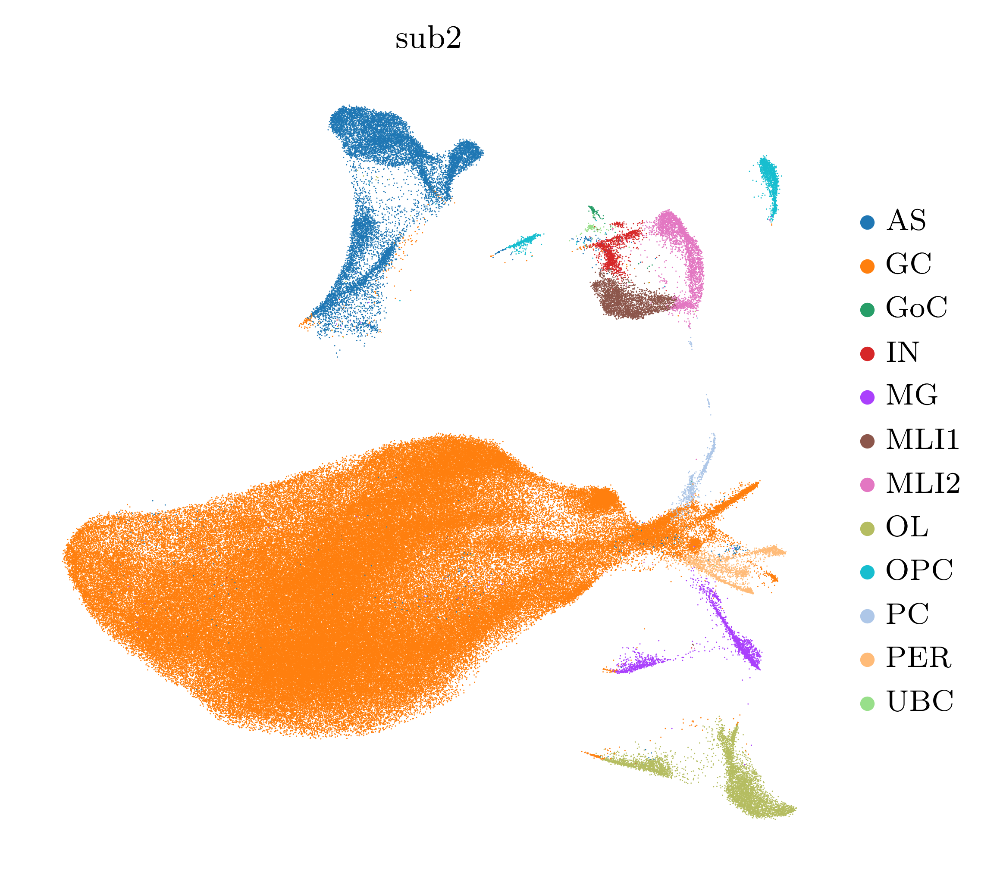

In [13]:
sc.pl.umap(adata, color ='sub2')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:04)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


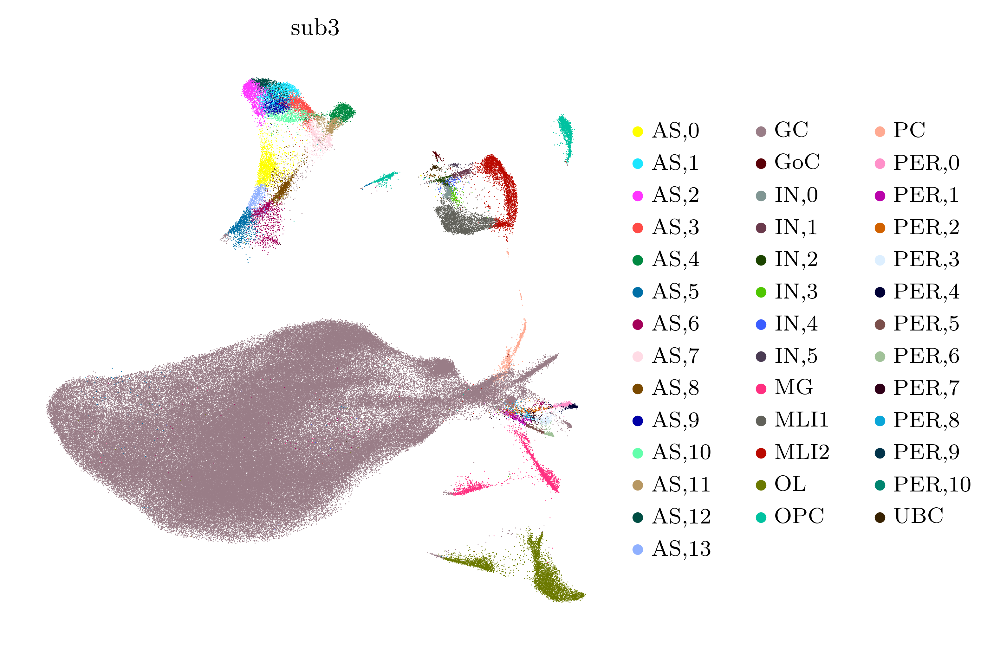

In [14]:
sc.tl.louvain(adata, resolution=2, restrict_to=('sub2', ['AS']), key_added='sub3')
sc.tl.louvain(adata, resolution=1, restrict_to=('sub3', ['IN']), key_added='sub3')
sc.tl.louvain(adata, resolution=2, restrict_to=('sub3', ['PER']), key_added='sub3')
sc.pl.umap(adata, color ='sub3')

In [15]:
#sc.tl.dendrogram(adata, groupby='sub3')
sc.pl.dotplot(adata, markers, groupby='sub3', standard_scale='var', dendrogram =True)

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_sub3']`
categories: AS,0, AS,1, AS,2, etc.
var_group_labels: Granule cell, Unipolar brush cell, Purkinje cell, etc.


In [16]:
# annotate cell type

GC = ['GC']
UBC =['UBC']
GoC = ['GoC']
PC = ['PC']
MLI1 = ['MLI1','IN,0','IN,3','IN,2']
MLI2 = ['MLI2','IN,1','IN,4','IN,5']
AS = ['AS,8','AS,4','AS,11','AS,7','AS,5','AS,6']
BG =['AS,0','AS,1','AS,2','AS,12','AS,3','AS,9','AS,10','AS,13']
OPC = ['OPC']
OL = ['OL']
MG = ['MG']
PER = ['PER,10','PER,3','PER,7']
END = ['PER,9','PER,2','PER,8','PER,1','PER,6','PER,5','PER,0','PER,4']
ctype = []
for i in adata.obs['sub3'] : # verbose loop for quality-assurance
    if i in GC :
        ctype.append('GC')
    elif i in UBC :
        ctype.append('UBC')
    elif i in GoC :
        ctype.append('GoC')
    elif i in PC :
        ctype.append('PC')  
    elif i in MLI1 :
        ctype.append('MLI1')  
    elif i in MLI2 :
        ctype.append('MLI2')
    elif i in AS :
        ctype.append('AS')        
    elif i in BG :
        ctype.append('BG')  
    elif i in OPC :
        ctype.append('OPC')  
    elif i in OL :
        ctype.append('OL')
    elif i in MG :
        ctype.append('MG')  
    elif i in PER :
        ctype.append('PER')
    elif i in END :
        ctype.append('END')
    else :
        raise ValueError('Encountered unclassifiable genotype for sample {}'.format(i))
adata.obs['sub4']=ctype


print(adata)

AnnData object with n_obs × n_vars = 238149 × 34430
    obs: 'doublet_score', 'predicted_doublet', 'batch', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pmito', 'n_genes', 'n_counts', 'louvain', 'ctype2', 'sub1', 'sub2', 'sub3', 'sub4'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'batch_colors', 'genotype_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'ctype2_colors', 'sub1_colors', 'dendrogram_sub1', 'sub2_colors', 'sub3_colors', 'dendrogram_sub3'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [17]:
adata = adata[adata.obs.predicted_doublet == False, :]

Trying to set attribute `.obs` of view, copying.
... storing 'sub4' as categorical


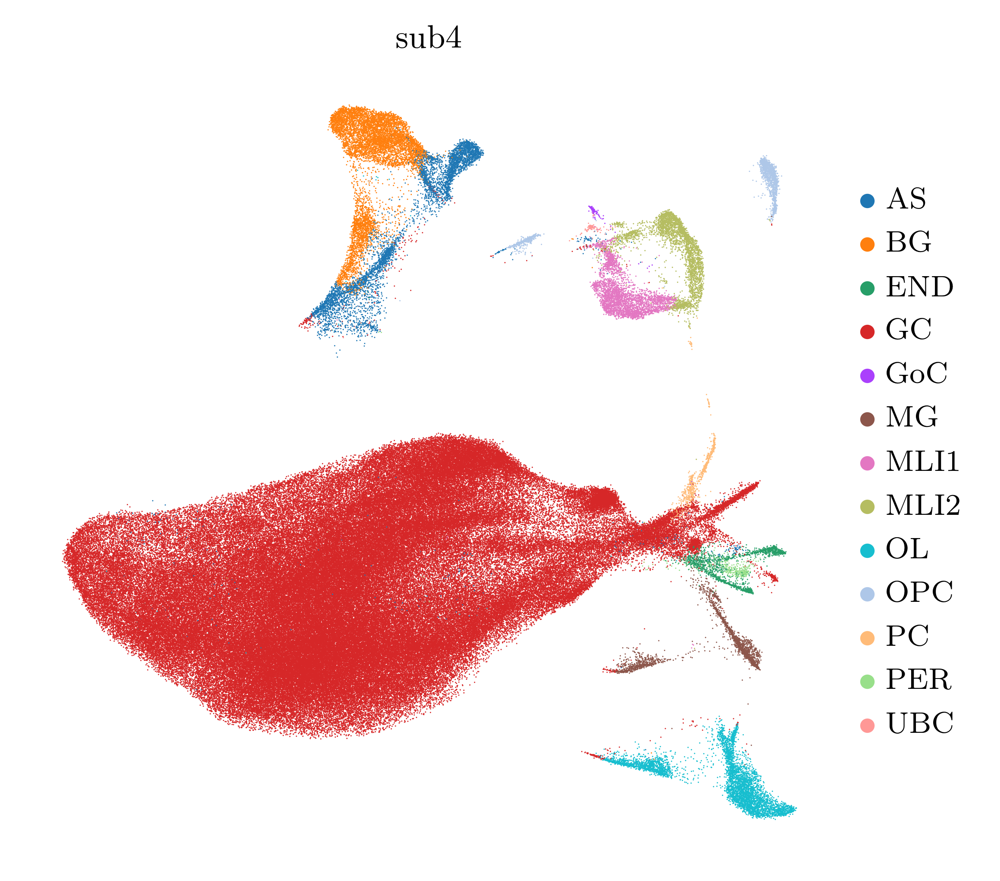

In [18]:
sc.pl.umap(adata, color ='sub4')

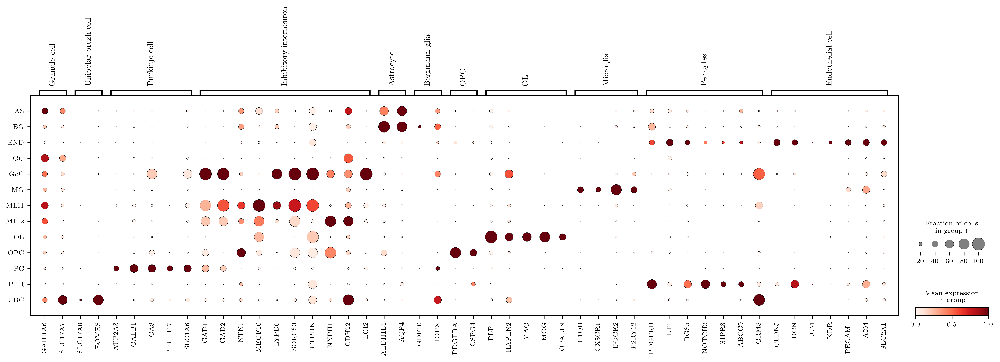

In [19]:
sc.pl.dotplot(adata, markers, groupby='sub4', standard_scale='var')

In [20]:
adata.obs.sub4.value_counts()

GC      204442
BG        7937
AS        5667
OL        5336
MLI1      3592
MLI2      3527
MG        2240
OPC       1918
END       1491
PC         749
PER        350
GoC        166
UBC        141
Name: sub4, dtype: int64

In [4]:
adata.obs['sub4'].cat.set_categories(['GC','UBC','PC','MLI1','MLI2','GoC','AS','BG','OPC','OL','MG','PER','END'], ordered=True, inplace=True)

In [5]:
##Original - use for UMAP

cmap_sub4={'GC': '#FAC18A',
            'UBC': '#BA61BA',
            'PC': '#EE5264',
            'MLI1': '#F9EBAE',
            'MLI2': '#88BB92',
            'GoC': '#46A928',
            'AS': '#F9AEAE',
            'BG': '#AEB7F9',
            'OPC': '#F1815F',
            'OL': '#75A3B7',
            'MG': '#AC5861',
            'PER': '#2D284B',
            'END': '#1C67EE'}

adata.uns['sub4_colors']=np.array(list(cmap_sub4.values()),dtype=object)
adata.obs['sub4'].cat.reorder_categories(new_categories=list(cmap_sub4.keys()),
                                         inplace=True,ordered=True)

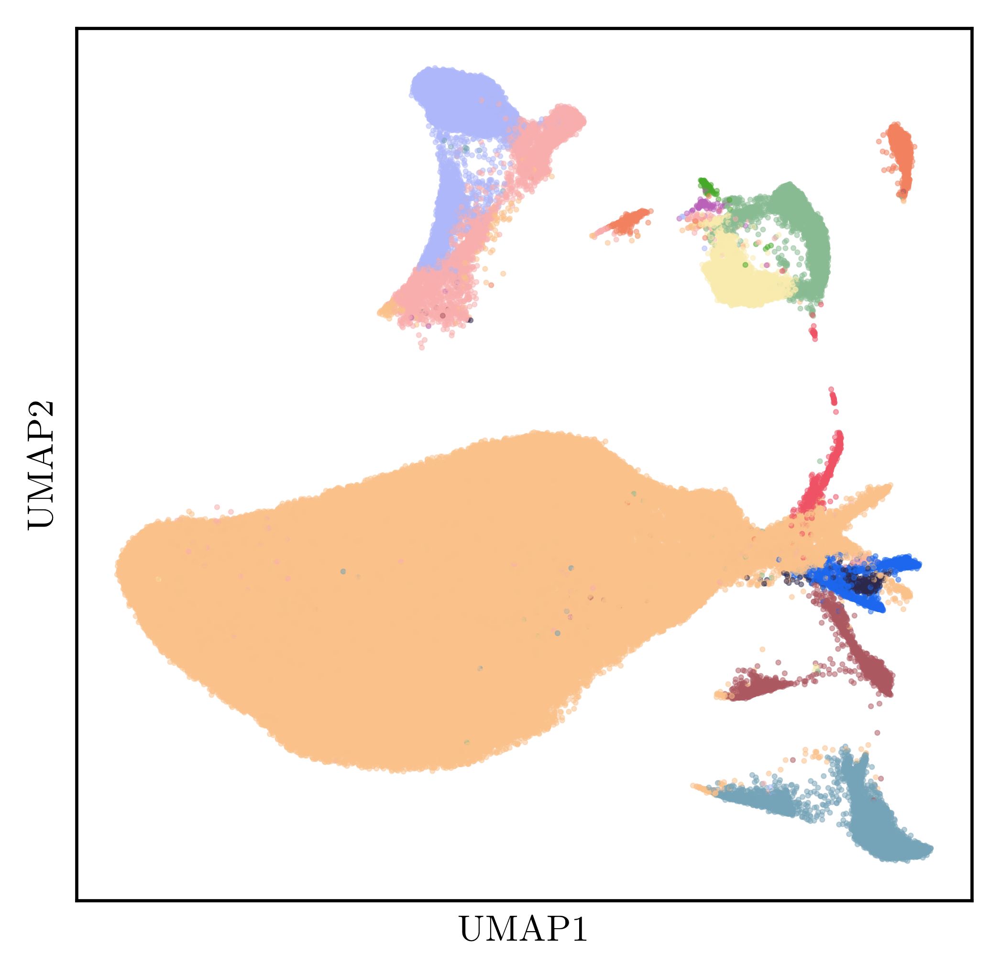

In [6]:
fig,ax=plt.subplots(1,1,figsize=(4,4))
scprep.plot.scatter2d(adata.obsm['X_umap'],
                      c=adata.obs['sub4'],
                      cmap=cmap_sub4,
                      ticks=None,
                      label_prefix='UMAP',
                      legend=False,
                      ax=ax,
                      s = 0.2,
                      alpha=0.6,
                      rasterized=True)
if True :
    fig.savefig(os.path.join(pfp,'230502_hum_umap_ctype.pdf'),dpi=600,bbox_inches='tight')

In [ ]:
## swapping color manually - use for violin after imputation

cmap_sub4={'GC': '#F9EBAE',
            'UBC': '#1C67EE',
            'PC': '#AC5861',
            'MLI1': '#F9AEAE',
            'MLI2': '#AEB7F9',
            'GoC': '#88BB92',
            'AS': '#FAC18A',
            'BG': '#BA61BA',
            'OPC': '#75A3B7',
            'OL': '#F1815F',
            'MG': '#46A928',
            'PER': '#2D284B',
            'END': '#EE5264'}

adata.uns['sub4_colors']=np.array(list(cmap_sub4.values()),dtype=object)
adata.obs['sub4'].cat.reorder_categories(new_categories=list(cmap_sub4.keys()),
                                         inplace=True,ordered=True)

In [ ]:
sc.pl.stacked_violin(adata, markers, groupby='sub4', 
                     use_raw = False, var_group_rotation=0, 
                     layer = 'imputed_bbknn', standard_scale='var',
                    row_palette=[cmap_sub8[i] for i in sorted(cmap_sub4.keys())],
                    save = '230523_human_violin')

In [24]:
# save data objects
adata.write(os.path.join(pdfp,'230502_human_ctype.h5ad'))
print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))

saved @230502.13:19:50


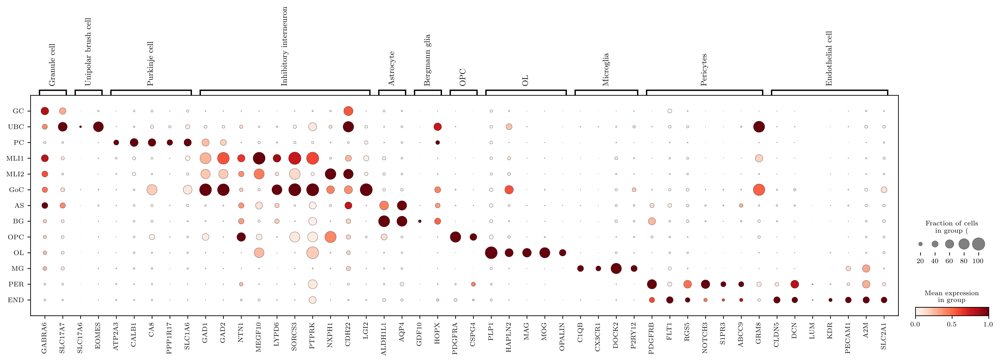

In [25]:
sc.pl.dotplot(adata, markers, groupby='sub4', standard_scale='var')

In [3]:
# Load Data

if True :
    start = time.time()
    backed=None # None if not
    fname='230502_human_ctype.h5ad' # for full, can maybe get away with ~300G
    %memit adata = sc.read_h5ad(os.path.join(pdfp,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))

peak memory: 11602.45 MiB, increment: 11300.32 MiB
loaded @230503.12:43:57
took 17.06-s to load data
